In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

# Install wandb
!pip install wandb

import torch
import torch.nn as nn
import numpy as np
import math
import wandb
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

paths = {
    "NURBS": (
        "/content/drive/MyDrive/LDC_data/nurbs_lid_driven_cavity_X.npz",
        "/content/drive/MyDrive/LDC_data/nurbs_lid_driven_cavity_Y.npz"
    ),
    "Harmonics": (
        "/content/drive/MyDrive/LDC_data/harmonics_lid_driven_cavity_X.npz",
        "/content/drive/MyDrive/LDC_data/harmonics_lid_driven_cavity_Y.npz"
    ),
    "Skelneton": (
        "/content/drive/MyDrive/LDC_data/skelneton_lid_driven_cavity_X.npz",
        "/content/drive/MyDrive/LDC_data/skelneton_lid_driven_cavity_Y.npz"
    )
}

Mounted at /content/drive
Using device: cuda


In [ ]:
def create_coords(H, W, device, num_fourier=8):
    """
    Creates normalized (x,y) coords in [0,1]^2 and appends Fourier features.
    Fourier features dramatically help SIREN trunk learn fine spatial structure.
    Output shape: [H*W, 2 + 4*num_fourier]
    """
    x = torch.linspace(0, 1, H)
    y = torch.linspace(0, 1, W)
    grid_x, grid_y = torch.meshgrid(x, y, indexing='ij')
    coords = torch.stack([grid_x, grid_y], dim=-1).reshape(-1, 2)  # [H*W, 2]

    # Fourier feature mapping: [sin(2^k * pi * x), cos(2^k * pi * x)] for k=0..num_fourier-1
    freqs = 2.0 ** torch.arange(0, num_fourier, dtype=torch.float32)  # [num_fourier]
    # coords: [N,2], freqs: [F] -> [N, 2, F]
    args = math.pi * coords.unsqueeze(-1) * freqs.unsqueeze(0).unsqueeze(0)
    fourier = torch.cat([torch.sin(args), torch.cos(args)], dim=-1)  # [N, 2, 2F]
    fourier = fourier.reshape(coords.shape[0], -1)                   # [N, 4F]

    coords_enc = torch.cat([coords, fourier], dim=-1)                 # [N, 2+4F]
    return coords_enc.to(device)

In [ ]:
class SineLayer(nn.Module):
    """
    One SIREN layer: Linear -> sin(omega_0 * x).
    Initialization follows Sitzmann et al. (2020) exactly.
    """
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30.0):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(
                    -1 / self.in_features,
                     1 / self.in_features
                )
            else:
                bound = np.sqrt(6 / self.in_features) / self.omega_0
                self.linear.weight.uniform_(-bound, bound)

    def forward(self, x):
        return torch.sin(self.omega_0 * self.linear(x))


class SirenNet(nn.Module):
    """
    Full SIREN network. Final layer is linear (no sine).
    Increased depth (num_layers=6) and width (512) vs original.
    """
    def __init__(self, in_dim, hidden=512, out_dim=512,
                 num_layers=6, first_omega_0=30.0, hidden_omega_0=30.0):
        super().__init__()
        self.net = nn.Sequential()

        # First layer
        self.net.add_module(
            "layer_0",
            SineLayer(in_dim, hidden, is_first=True, omega_0=first_omega_0)
        )

        # Hidden layers
        for i in range(1, num_layers - 1):
            self.net.add_module(
                f"layer_{i}",
                SineLayer(hidden, hidden, is_first=False, omega_0=hidden_omega_0)
            )

        # Final linear layer — properly initialized
        final_linear = nn.Linear(hidden, out_dim, bias=True)
        with torch.no_grad():
            bound = np.sqrt(6 / hidden) / hidden_omega_0
            final_linear.weight.uniform_(-bound, bound)
            nn.init.zeros_(final_linear.bias)
        self.net.add_module(f"layer_{num_layers - 1}", final_linear)

    def forward(self, x):
        return self.net(x)

In [ ]:
class DeepONet(nn.Module):
    """
    DeepONet with SIREN branch and trunk.

    Branch: encodes flattened input field -> latent vector [B, latent_dim]
    Trunk:  encodes Fourier-augmented (x,y) coords -> [N, 3*latent_dim]
            (one latent block per output channel: u, v, p)

    Output via einsum: for each batch sample and spatial point,
    dot product between branch vector and per-channel trunk vectors.
    """
    def __init__(self, branch_dim, coord_dim, latent_dim=512):
        super().__init__()
        self.latent_dim = latent_dim

        # Branch: processes flattened input field
        # omega_0=1.0 — input values are arbitrary floats, not coordinates
        self.branch = SirenNet(
            in_dim=branch_dim,
            hidden=512,
            out_dim=latent_dim,
            num_layers=6,
            first_omega_0=1.0,
            hidden_omega_0=1.0
        )

        # Trunk: processes Fourier-encoded spatial coordinates
        # omega_0=30.0 — standard for spatial SIREN
        self.trunk = SirenNet(
            in_dim=coord_dim,
            hidden=512,
            out_dim=latent_dim * 3,   # 3 output channels: u, v, p
            num_layers=6,
            first_omega_0=30.0,
            hidden_omega_0=30.0
        )

        # Learnable per-channel bias (one scalar per output channel)
        self.bias = nn.Parameter(torch.zeros(3))

    def forward(self, branch_input, coords):
        branch_out = self.branch(branch_input)            # [B, latent]
        trunk_out  = self.trunk(coords)                   # [N, 3*latent]
        trunk_out  = trunk_out.view(-1, 3, self.latent_dim)  # [N, 3, latent]

        # einsum: for each batch b, each point n, each channel c:
        # output[b,n,c] = sum_k branch[b,k] * trunk[n,c,k]
        output = torch.einsum("bk,nck->bnc", branch_out, trunk_out)
        output = output + self.bias                        # [B, N, 3]
        return output

In [ ]:
def relative_l2(pred, true):
    """
    Correct relative L2: norm of error / norm of true values.
    Computed over ALL elements (not averaged over batches).
    """
    return torch.norm(pred - true) / (torch.norm(true) + 1e-8)


class Normalizer:
    """
    Z-score normalizer. Computes mean/std from training data
    and applies/inverts the transform on GPU tensors.
    """
    def __init__(self, data, eps=1e-8):
        # data shape: [N, ...] - compute stats over sample dimension
        self.mean = data.mean(dim=0, keepdim=True)
        self.std  = data.std(dim=0, keepdim=True).clamp(min=eps)

    def encode(self, x):
        return (x - self.mean.to(x.device)) / self.std.to(x.device)

    def decode(self, x):
        return x * self.std.to(x.device) + self.mean.to(x.device)

In [ ]:
def train_geometry(geometry_name, x_path, y_path):
    print(f"\n==== Training on {geometry_name} ====")

    # ── Load & validate data ──────────────────────────────────────────────────
    X_data = np.load(x_path)["data"]
    Y_data = np.load(y_path)["data"]
    assert Y_data.shape[1] >= 3, "Y must have at least 3 channels (u, v, p)"
    Y_data = Y_data[:, 0:3, :, :]

    X = torch.tensor(X_data, dtype=torch.float32)
    Y = torch.tensor(Y_data, dtype=torch.float32)

    # ── Train / Val split ─────────────────────────────────────────────────────
    X_train, X_val, Y_train, Y_val = train_test_split(
        X, Y, test_size=0.2, random_state=42
    )

    # ── Fit normalizers on TRAINING data only ─────────────────────────────────
    N, C, H, W = X_train.shape

    X_flat_train = X_train.reshape(N, -1)
    X_flat_val   = X_val.reshape(X_val.shape[0], -1)

    x_norm = Normalizer(X_flat_train)
    X_flat_train = x_norm.encode(X_flat_train)
    X_flat_val   = x_norm.encode(X_flat_val)

    # Y normalizer: flatten spatial dims for stat computation
    Y_flat_train = Y_train.reshape(Y_train.shape[0], 3, -1)  # [N,3,H*W]
    y_norm = Normalizer(Y_flat_train)

    # ── DataLoaders ───────────────────────────────────────────────────────────
    train_loader = DataLoader(
        TensorDataset(X_flat_train, Y_train),
        batch_size=16, shuffle=True, pin_memory=True
    )
    val_loader = DataLoader(
        TensorDataset(X_flat_val, Y_val),
        batch_size=16, shuffle=False, pin_memory=True
    )

    # ── Coords (Fourier-encoded, fixed) ───────────────────────────────────────
    NUM_FOURIER = 8
    coords = create_coords(H, W, device, num_fourier=NUM_FOURIER)
    coord_dim = 2 + 4 * NUM_FOURIER  # 2 raw + 4*F Fourier features

    # ── Model, optimizer, scheduler ───────────────────────────────────────────
    branch_dim = C * H * W
    model     = DeepONet(branch_dim=branch_dim, coord_dim=coord_dim, latent_dim=512).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
    epochs    = 100
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=epochs, eta_min=1e-6
    )
    mse = nn.MSELoss()

    # ── W&B init ──────────────────────────────────────────────────────────────
    wandb.init(
        project="DeepONet-LDC",
        group="DeepONet-SIREN-v2",
        name=f"{geometry_name}-run",
        config={
            "geometry":    geometry_name,
            "epochs":      epochs,
            "lr":          3e-4,
            "latent_dim":  512,
            "num_layers":  6,
            "hidden_dim":  512,
            "fourier_features": NUM_FOURIER,
            "resolution":  H,
            "activation":  "SIREN",
            "normalization": "z-score"
        }
    )

    best_val_l2   = float("inf")
    save_path     = f"/content/drive/MyDrive/LDC_data/{geometry_name}_best.pt"

    # ── Training loop ─────────────────────────────────────────────────────────
    for epoch in range(epochs):
        model.train()
        train_num, train_den = 0.0, 0.0
        total_loss = 0.0

        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)        # already flattened & normalized
            yb = yb.to(device, non_blocking=True)        # [B, 3, H, W], raw scale

            # Normalize targets
            yb_flat = yb.reshape(yb.shape[0], 3, -1)
            yb_norm = y_norm.encode(yb_flat)             # [B, 3, H*W]
            yb_norm_spatial = yb_norm.permute(0, 2, 1)  # [B, H*W, 3]

            pred = model(xb, coords)                     # [B, H*W, 3]
            loss = mse(pred, yb_norm_spatial)

            optimizer.zero_grad()
            loss.backward()
            # Gradient clipping — critical for SIREN stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            total_loss  += loss.item()
            # Accumulate for correct relative L2 in normalized space
            train_num   += torch.norm(pred - yb_norm_spatial).item()
            train_den   += torch.norm(yb_norm_spatial).item()

        scheduler.step()
        train_loss = total_loss / len(train_loader)
        train_l2   = train_num / (train_den + 1e-8)

        # ── Validation ────────────────────────────────────────────────────────
        model.eval()
        val_num, val_den = 0.0, 0.0
        val_loss_sum = 0.0

        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)

                yb_flat = yb.reshape(yb.shape[0], 3, -1)
                yb_norm = y_norm.encode(yb_flat)
                yb_norm_spatial = yb_norm.permute(0, 2, 1)

                pred = model(xb, coords)
                val_loss_sum += mse(pred, yb_norm_spatial).item()
                val_num      += torch.norm(pred - yb_norm_spatial).item()
                val_den      += torch.norm(yb_norm_spatial).item()

        val_loss = val_loss_sum / len(val_loader)
        val_l2   = val_num / (val_den + 1e-8)

        # ── Checkpoint best model ─────────────────────────────────────────────
        if val_l2 < best_val_l2:
            best_val_l2 = val_l2
            torch.save({
                "epoch":      epoch,
                "model":      model.state_dict(),
                "optimizer":  optimizer.state_dict(),
                "val_l2":     best_val_l2,
                "x_norm_mean": x_norm.mean,
                "x_norm_std":  x_norm.std,
                "y_norm_mean": y_norm.mean,
                "y_norm_std":  y_norm.std,
            }, save_path)

        wandb.log({
            "epoch":        epoch,
            "train_loss":   train_loss,
            "val_loss":     val_loss,
            "train_rel_L2": train_l2,
            "val_rel_L2":   val_l2,
            "lr":           scheduler.get_last_lr()[0],
            "best_val_L2":  best_val_l2
        })

        if epoch % 20 == 0:
            print(f"{geometry_name} | Epoch {epoch:3d} | "
                  f"Train L2: {train_l2:.4f} | Val L2: {val_l2:.4f} | "
                  f"Best: {best_val_l2:.4f} | LR: {scheduler.get_last_lr()[0]:.2e}")

    print(f"\n{geometry_name} training done. Best Val L2: {best_val_l2:.4f}")
    wandb.finish()

In [ ]:
wandb.login()

for geometry_name, (x_path, y_path) in paths.items():
    train_geometry(geometry_name, x_path, y_path)

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: ghosalsohom2003 (ghosalsohom2003-own-use) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin



==== Training on NURBS ====


NURBS | Epoch   0 | Train L2: 1.5069 | Val L2: 1.2672 | Best: 1.2672 | LR: 3.00e-04
NURBS | Epoch  20 | Train L2: 1.0134 | Val L2: 1.0100 | Best: 1.0100 | LR: 2.69e-04
NURBS | Epoch  40 | Train L2: 1.0046 | Val L2: 1.0079 | Best: 1.0045 | LR: 1.92e-04
NURBS | Epoch  60 | Train L2: 1.0048 | Val L2: 1.0038 | Best: 1.0036 | LR: 9.99e-05
NURBS | Epoch  80 | Train L2: 1.0010 | Val L2: 1.0043 | Best: 1.0023 | LR: 2.69e-05

NURBS training done. Best Val L2: 1.0023


best_val_L2,█▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇████
lr,██████████▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▂▂▂▂▂▂▂▁▁▁
train_loss,█▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▁▁
train_rel_L2,█▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁▁
val_loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂
val_rel_L2,█▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▃▃
best_val_L2,1.00227
epoch,99
lr,0.0
train_loss,0.33292



==== Training on Harmonics ====


Harmonics | Epoch   0 | Train L2: 1.5306 | Val L2: 1.2010 | Best: 1.2010 | LR: 3.00e-04
Harmonics | Epoch  20 | Train L2: 1.0119 | Val L2: 1.0111 | Best: 1.0088 | LR: 2.69e-04
Harmonics | Epoch  40 | Train L2: 1.0058 | Val L2: 1.0031 | Best: 1.0031 | LR: 1.92e-04
Harmonics | Epoch  60 | Train L2: 1.0044 | Val L2: 1.0051 | Best: 1.0012 | LR: 9.99e-05
Harmonics | Epoch  80 | Train L2: 1.0001 | Val L2: 1.0039 | Best: 1.0012 | LR: 2.69e-05

Harmonics training done. Best Val L2: 0.9904


best_val_L2,█▇▆▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
lr,████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
train_loss,██▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▆▆▅▁
train_rel_L2,█▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▂▁
val_loss,█▇▆▆▅▃▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▃▃▂▁▂▆
val_rel_L2,█▆▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▃▂▂▂▂▂▃▃▂▂▂▂▂▂▂▂▂▁▃▅▅
best_val_L2,0.99041
epoch,99
lr,0.0
train_loss,0.29536



==== Training on Skelneton ====


Skelneton | Epoch   0 | Train L2: 1.5563 | Val L2: 1.2419 | Best: 1.2419 | LR: 3.00e-04
Skelneton | Epoch  20 | Train L2: 1.0092 | Val L2: 1.0099 | Best: 1.0099 | LR: 2.69e-04
Skelneton | Epoch  40 | Train L2: 1.0042 | Val L2: 1.0067 | Best: 1.0044 | LR: 1.92e-04
Skelneton | Epoch  60 | Train L2: 1.0043 | Val L2: 1.0043 | Best: 1.0032 | LR: 9.99e-05
Skelneton | Epoch  80 | Train L2: 1.0028 | Val L2: 1.0041 | Best: 1.0030 | LR: 2.69e-05

Skelneton training done. Best Val L2: 1.0010


best_val_L2,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
lr,███████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
train_loss,█▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁
train_rel_L2,█▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁
val_loss,▅▅▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄█
val_rel_L2,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄
best_val_L2,1.00099
epoch,99
lr,0.0
train_loss,0.56293



==== Visualizing NURBS ====


Saved: /content/drive/MyDrive/LDC_data/NURBS_sample113_streamlines.png


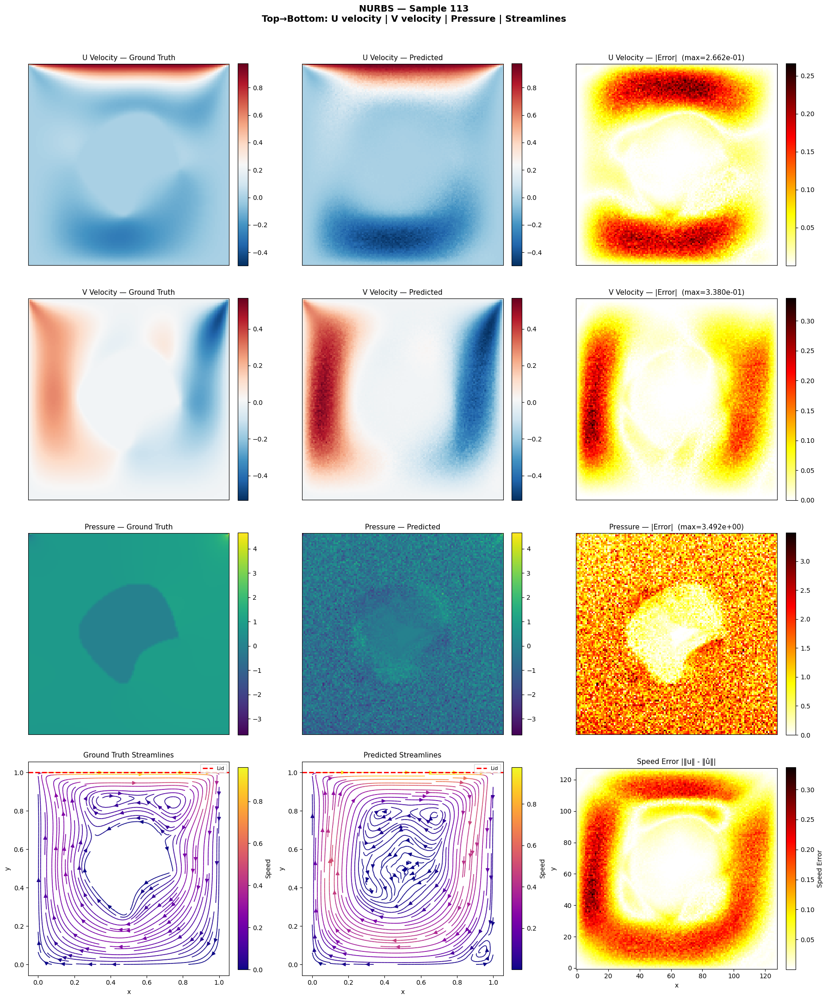

Saved: /content/drive/MyDrive/LDC_data/NURBS_sample118_streamlines.png


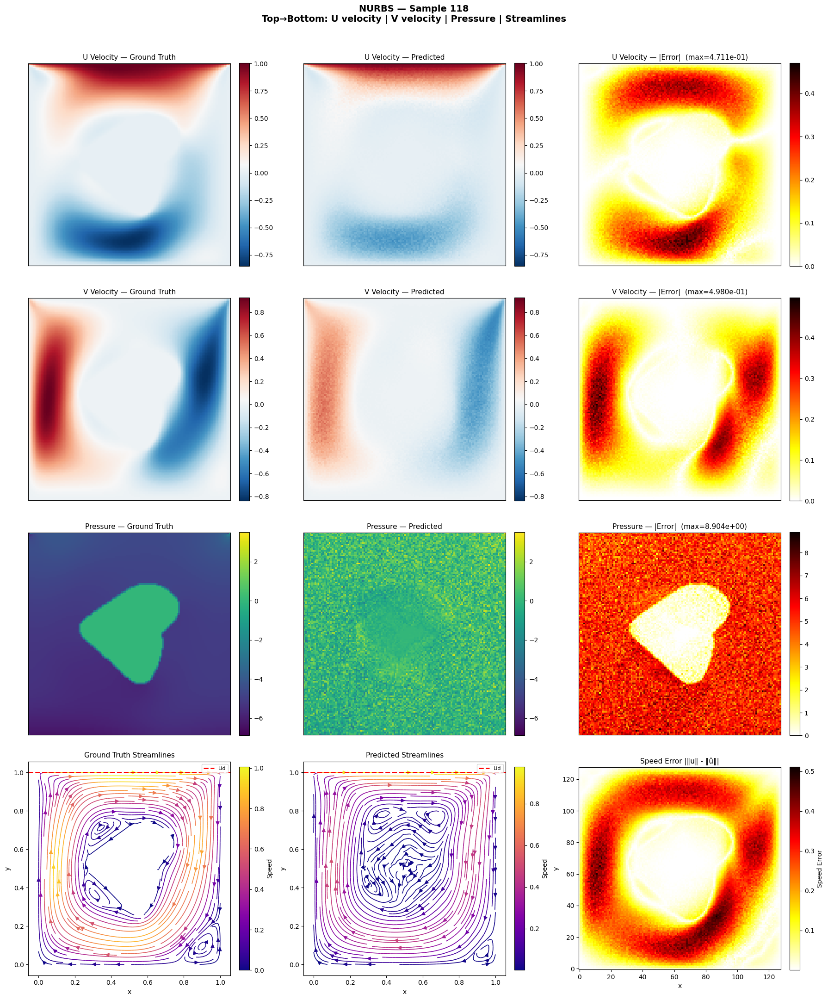

Saved: /content/drive/MyDrive/LDC_data/NURBS_sample42_streamlines.png


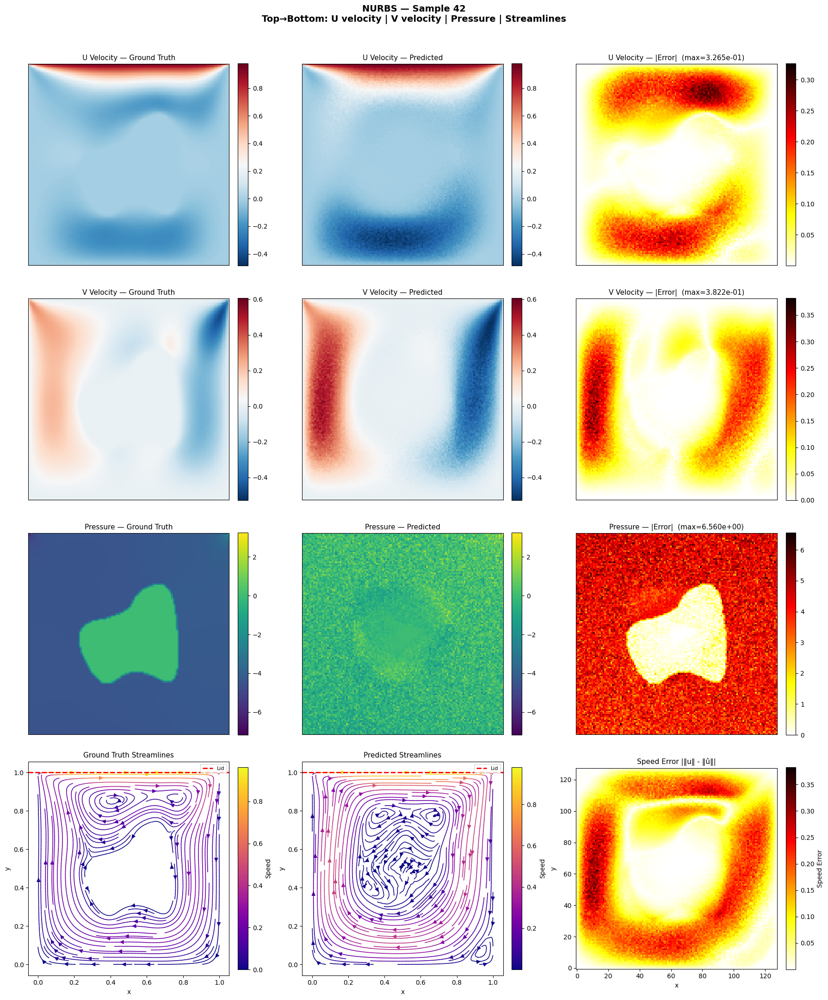


==== Visualizing Harmonics ====


Saved: /content/drive/MyDrive/LDC_data/Harmonics_sample77_streamlines.png


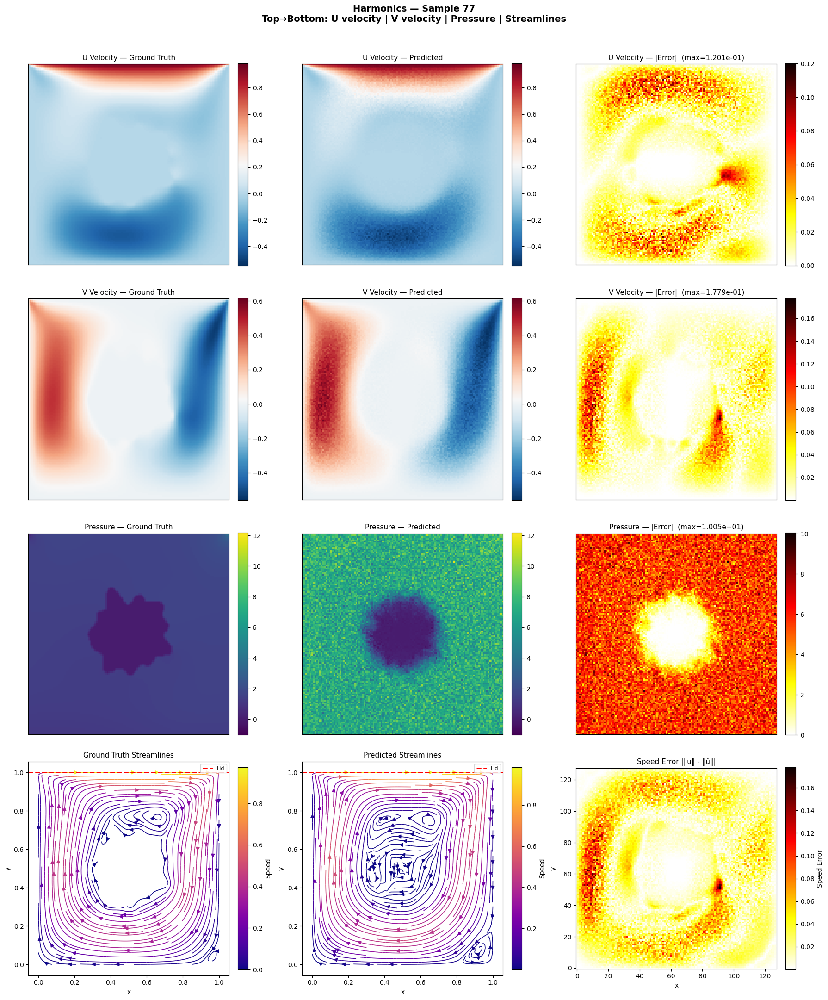

Saved: /content/drive/MyDrive/LDC_data/Harmonics_sample60_streamlines.png


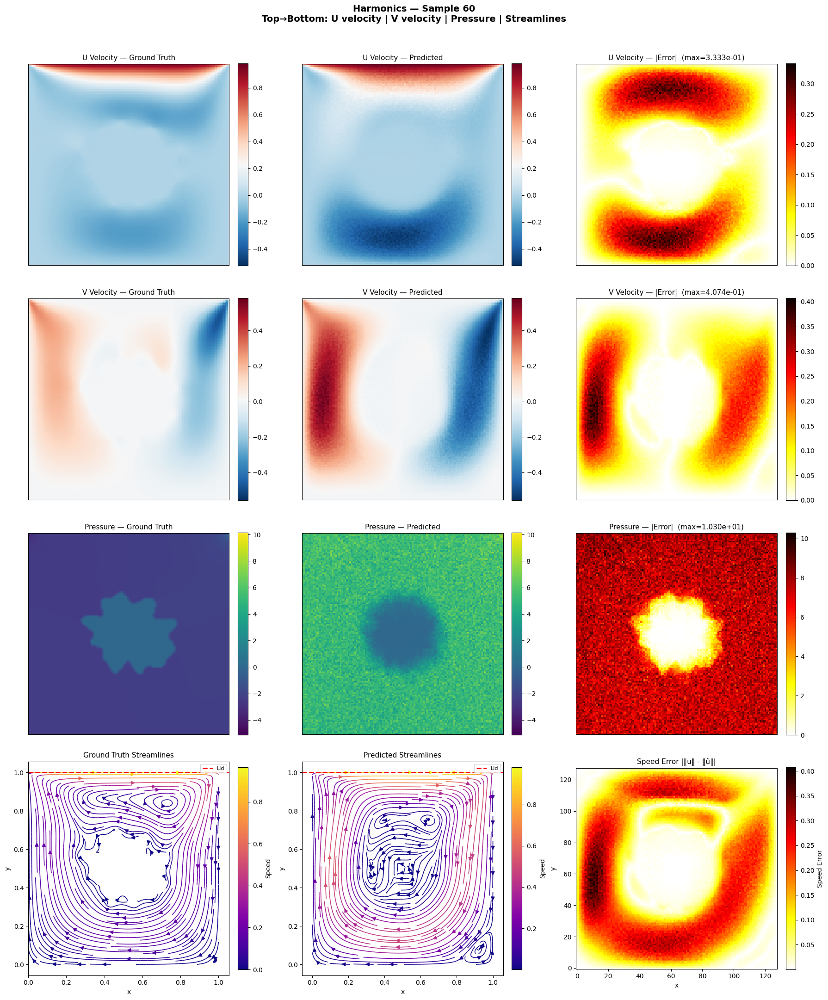

Saved: /content/drive/MyDrive/LDC_data/Harmonics_sample189_streamlines.png


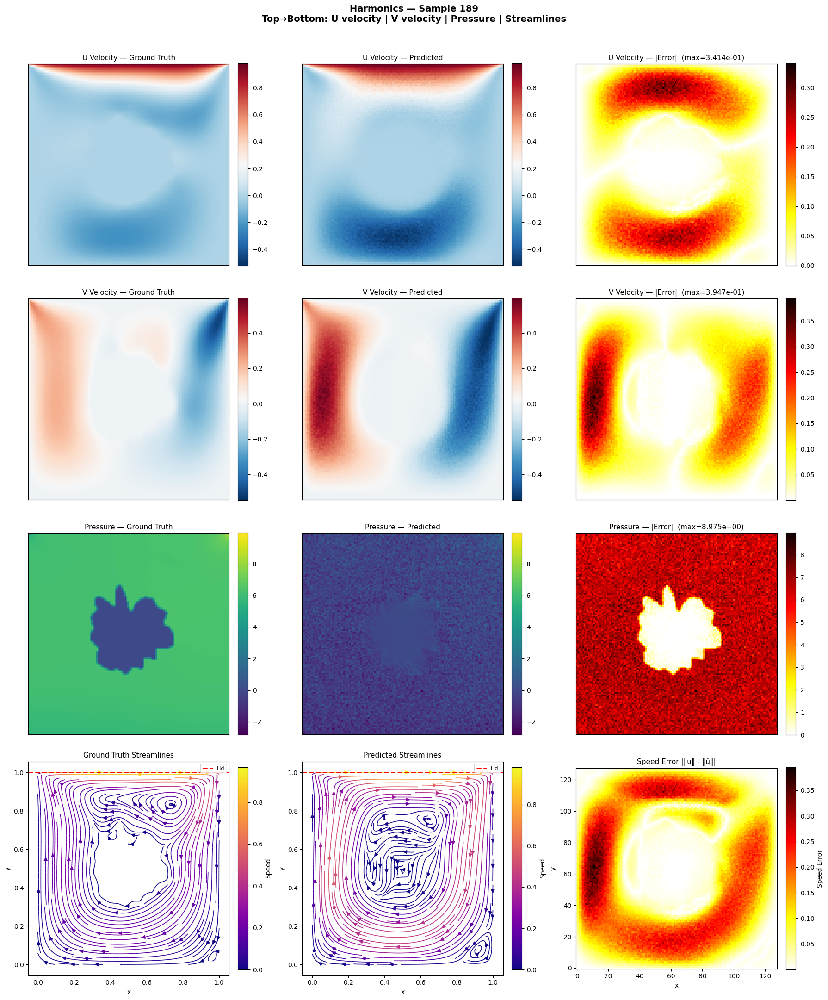


==== Visualizing Skelneton ====


Saved: /content/drive/MyDrive/LDC_data/Skelneton_sample178_streamlines.png


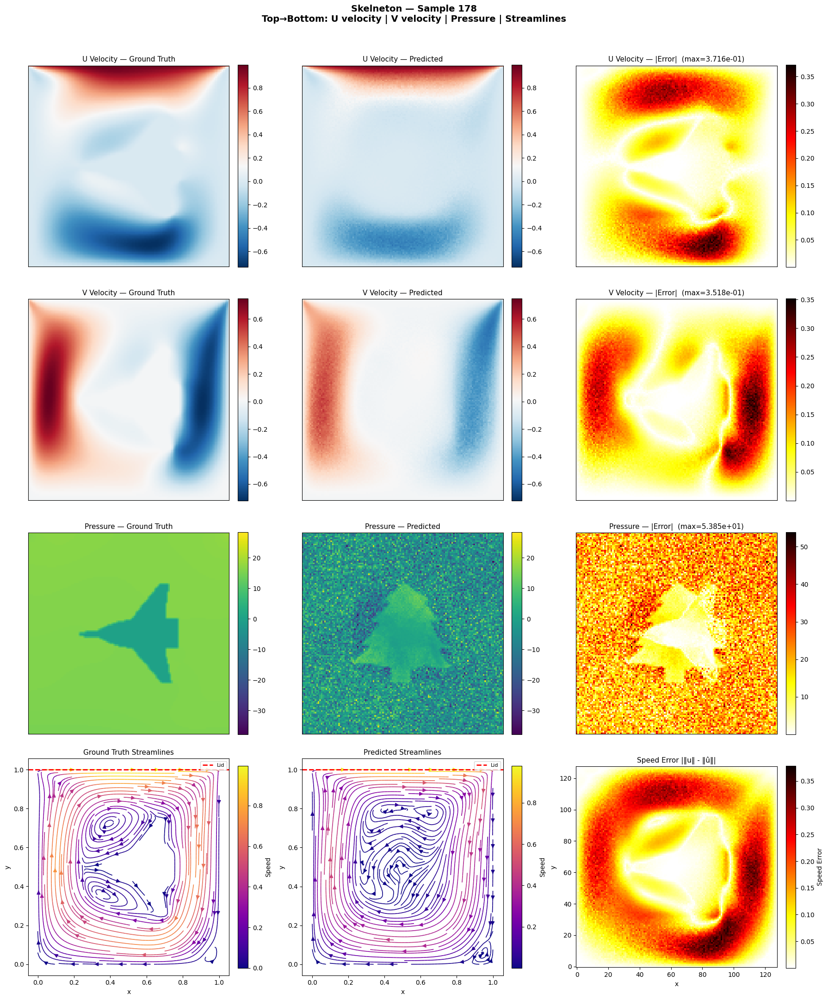

Saved: /content/drive/MyDrive/LDC_data/Skelneton_sample98_streamlines.png


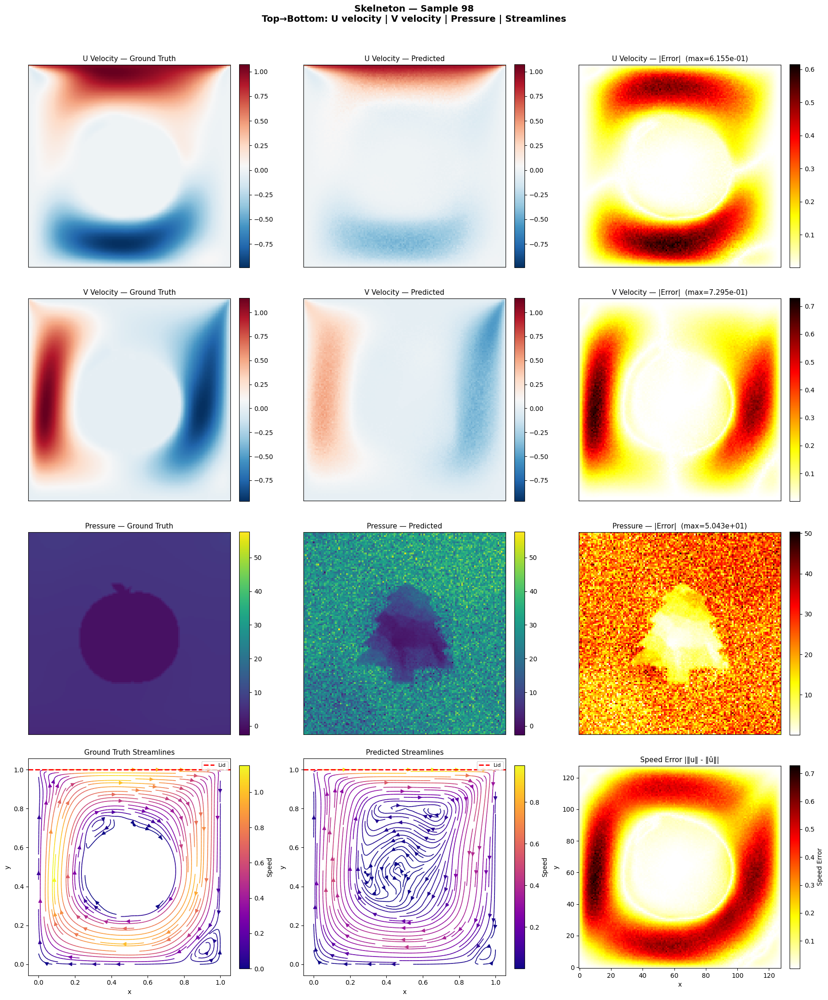

Saved: /content/drive/MyDrive/LDC_data/Skelneton_sample184_streamlines.png


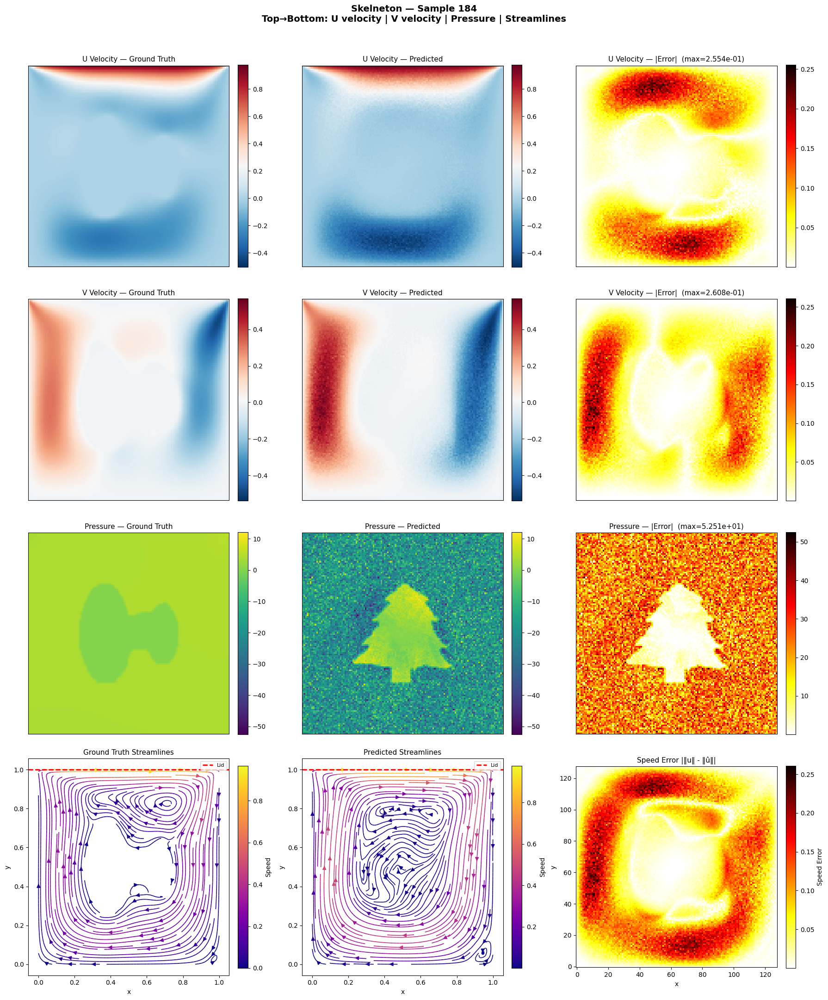

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import torch

def visualize_predictions(geometry_name, model, x_norm, y_norm, X_val, Y_val, coords, H, W, device, num_samples=3):
    """
    Generates streamline plots comparing ground truth vs predicted flow fields.
    Visualizes U velocity, V velocity, Pressure, and Streamlines side by side.
    """
    model.eval()

    # ── Pick random validation samples ───────────────────────────────────────
    indices = np.random.choice(len(X_val), size=num_samples, replace=False)

    for idx in indices:
        xb = X_val[idx:idx+1].to(device)          # [1, branch_dim] already normalized
        yb = Y_val[idx:idx+1].to(device)           # [1, 3, H, W] raw scale

        with torch.no_grad():
            pred_norm = model(xb, coords)           # [1, H*W, 3]

        # ── Denormalize prediction ────────────────────────────────────────────
        pred_norm_t = pred_norm.permute(0, 2, 1)   # [1, 3, H*W]
        pred_raw    = y_norm.decode(pred_norm_t)    # [1, 3, H*W]
        pred_field  = pred_raw.reshape(1, 3, H, W) # [1, 3, H, W]

        # ── Move to numpy ─────────────────────────────────────────────────────
        pred_np = pred_field[0].cpu().numpy()       # [3, H, W]
        true_np = yb[0].cpu().numpy()               # [3, H, W]

        U_pred, V_pred, P_pred = pred_np[0], pred_np[1], pred_np[2]
        U_true, V_true, P_true = true_np[0], true_np[1], true_np[2]

        # ── Speed magnitude ───────────────────────────────────────────────────
        speed_pred = np.sqrt(U_pred**2 + V_pred**2)
        speed_true = np.sqrt(U_true**2 + V_true**2)

        # ── Uniform grid for streamplot ───────────────────────────────────────
        x_lin = np.linspace(0, 1, W)
        y_lin = np.linspace(0, 1, H)
        X_grid, Y_grid = np.meshgrid(x_lin, y_lin)  # both [H, W]

        # ── Figure layout: 4 rows (U, V, P, Streamlines) x 3 cols (True, Pred, Error) ──
        fig, axes = plt.subplots(4, 3, figsize=(18, 22))
        fig.suptitle(
            f"{geometry_name} — Sample {idx}\nTop→Bottom: U velocity | V velocity | Pressure | Streamlines",
            fontsize=14, fontweight='bold', y=0.98
        )

        fields = [
            ("U Velocity",  U_true,     U_pred,     "RdBu_r"),
            ("V Velocity",  V_true,     V_pred,     "RdBu_r"),
            ("Pressure",    P_true,     P_pred,     "viridis"),
        ]

        # ── Rows 0–2: scalar field comparisons ───────────────────────────────
        for row, (label, true_f, pred_f, cmap) in enumerate(fields):
            error_f = np.abs(pred_f - true_f)
            vmin = min(true_f.min(), pred_f.min())
            vmax = max(true_f.max(), pred_f.max())

            # Ground truth
            im0 = axes[row, 0].imshow(
                true_f, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal'
            )
            axes[row, 0].set_title(f"{label} — Ground Truth", fontsize=11)
            plt.colorbar(im0, ax=axes[row, 0], fraction=0.046, pad=0.04)

            # Prediction
            im1 = axes[row, 1].imshow(
                pred_f, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal'
            )
            axes[row, 1].set_title(f"{label} — Predicted", fontsize=11)
            plt.colorbar(im1, ax=axes[row, 1], fraction=0.046, pad=0.04)

            # Absolute error
            im2 = axes[row, 2].imshow(
                error_f, origin='lower', cmap='hot_r', aspect='equal'
            )
            axes[row, 2].set_title(
                f"{label} — |Error|  (max={error_f.max():.3e})", fontsize=11
            )
            plt.colorbar(im2, ax=axes[row, 2], fraction=0.046, pad=0.04)

            for ax in axes[row]:
                ax.set_xticks([]); ax.set_yticks([])

        # ── Row 3: Streamline plots ───────────────────────────────────────────
        streamline_configs = [
            ("Ground Truth Streamlines", U_true, V_true, speed_true),
            ("Predicted Streamlines",    U_pred, V_pred, speed_pred),
            ("Speed Error |‖u‖ - ‖û‖|", None,   None,   np.abs(speed_true - speed_pred)),
        ]

        for col, (title, U, V, speed) in enumerate(streamline_configs):
            ax = axes[3, col]

            if col < 2:
                # Streamlines colored by speed magnitude
                strm = ax.streamplot(
                    X_grid, Y_grid,
                    U, V,
                    color=speed,
                    cmap='plasma',
                    linewidth=1.2,
                    density=1.8,
                    arrowsize=1.2,
                    norm=mcolors.Normalize(vmin=speed.min(), vmax=speed.max())
                )
                plt.colorbar(strm.lines, ax=ax, fraction=0.046, pad=0.04, label='Speed')

                # Mark lid (top boundary) — moving wall
                ax.axhline(y=1.0, color='red', linewidth=2.0, linestyle='--', label='Lid')
                ax.legend(fontsize=8, loc='upper right')
            else:
                # Speed magnitude error as heatmap
                im = ax.imshow(
                    speed, origin='lower', cmap='hot_r', aspect='equal'
                )
                plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Speed Error')

            ax.set_title(title, fontsize=11)
            ax.set_xlabel("x"); ax.set_ylabel("y")

        plt.tight_layout(rect=[0, 0, 1, 0.97])

        # ── Save figure ───────────────────────────────────────────────────────
        save_fig_path = f"/content/drive/MyDrive/LDC_data/{geometry_name}_sample{idx}_streamlines.png"
        plt.savefig(save_fig_path, dpi=150, bbox_inches='tight')
        print(f"Saved: {save_fig_path}")

        # Log to W&B
        wandb.log({f"{geometry_name}/streamline_sample_{idx}": wandb.Image(fig)})
        plt.show()
        plt.close(fig)


def run_visualization(geometry_name, x_path, y_path, checkpoint_path, device, num_samples=3):
    """
    Loads the best saved checkpoint and runs streamline visualization
    on random validation samples.
    """
    print(f"\n==== Visualizing {geometry_name} ====")

    # ── Reload raw data ───────────────────────────────────────────────────────
    X_data = np.load(x_path)["data"]
    Y_data = np.load(y_path)["data"][:, 0:3, :, :]
    X = torch.tensor(X_data, dtype=torch.float32)
    Y = torch.tensor(Y_data, dtype=torch.float32)

    _, X_val, _, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

    N_full, C, H, W = X.shape

    # ── Load checkpoint ───────────────────────────────────────────────────────
    ckpt = torch.load(checkpoint_path, map_location=device)

    # Restore normalizers from checkpoint
    class RestoredNormalizer:
        def __init__(self, mean, std):
            self.mean = mean
            self.std  = std
        def encode(self, x):
            return (x - self.mean.to(x.device)) / self.std.to(x.device)
        def decode(self, x):
            return x * self.std.to(x.device) + self.mean.to(x.device)

    x_norm = RestoredNormalizer(ckpt["x_norm_mean"], ckpt["x_norm_std"])
    y_norm = RestoredNormalizer(ckpt["y_norm_mean"], ckpt["y_norm_std"])

    # ── Rebuild model ─────────────────────────────────────────────────────────
    NUM_FOURIER = 8
    coord_dim   = 2 + 4 * NUM_FOURIER
    branch_dim  = C * H * W

    model = DeepONet(branch_dim=branch_dim, coord_dim=coord_dim, latent_dim=512).to(device)
    model.load_state_dict(ckpt["model"])
    model.eval()

    coords = create_coords(H, W, device, num_fourier=NUM_FOURIER)

    # ── Normalize val inputs ──────────────────────────────────────────────────
    X_val_flat = X_val.reshape(X_val.shape[0], -1)
    X_val_norm = x_norm.encode(X_val_flat)

    # ── Run visualization ─────────────────────────────────────────────────────
    wandb.init(
        project="DeepONet-LDC",
        group="DeepONet-SIREN-v2-VIZ",
        name=f"{geometry_name}-viz"
    )

    visualize_predictions(
        geometry_name=geometry_name,
        model=model,
        x_norm=x_norm,
        y_norm=y_norm,
        X_val=X_val_norm,
        Y_val=Y_val,
        coords=coords,
        H=H, W=W,
        device=device,
        num_samples=num_samples
    )

    wandb.finish()


# ── Run for all geometries ────────────────────────────────────────────────────
for geometry_name, (x_path, y_path) in paths.items():
    checkpoint_path = f"/content/drive/MyDrive/LDC_data/{geometry_name}_best.pt"
    run_visualization(geometry_name, x_path, y_path, checkpoint_path, device, num_samples=3)